## NLP Final Project
### Shikhar Madrecha

# Importing Libraries

In [1]:
!pip install texthero
!pip install vaderSentiment
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 6.6 MB/s 
     |████████████████████████████████| 235 kB 38.1 MB/s 
     |████████████████████████████████| 749 kB 7.9 MB/s 
  Attempting uninstall: regex
    Found existing installation: regex 2019.12.20
    Uninstalling regex-2019.12.20:
      Successfully uninstalled regex-2019.12.20
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 5.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 5.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend d

In [2]:
#Importing libraries

import warnings
warnings.filterwarnings("ignore")


import pandas as pd
import numpy as np
import texthero as hero
import re

import matplotlib.pyplot as plt
import nltk

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from nltk.tokenize import sent_tokenize

import spacy 
from spacy import displacy

nlp = spacy.load("en_core_web_sm")

nltk.download('punkt')


import gensim
from gensim import corpora, models
from gensim.models.ldamulticore import LdaMulticore
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# import pyLDAvis.gensim
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

import os
import time
import math
import re
from pprint import pprint
from textblob import TextBlob
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt


import nltk as nltk
from nltk.corpus import stopwords
# from nltk.stem.wordnet import WordNetLemmatizer
import spacy
import multiprocessing
import string


import gensim
from gensim import corpora, models
from gensim.models.ldamulticore import LdaMulticore
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# import pyLDAvis.gensim
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()


import sklearn
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.pipeline import make_pipeline
from sklearn import metrics

from joblib import dump, load

import warnings
warnings.filterwarnings("ignore")
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [3]:
#reading in the data
data = pd.read_json('https://storage.googleapis.com/msca-bdp-data-open/news/news_final_project.json', orient='records', lines=True)
data.head(2)

,date,language,title,text
0,2022-01-06,english,"No deal, no school: Chicago cancels classes fo...",CHICAGO (AP) — Chicago school leaders canceled...
1,2022-01-06,english,"No deal, no school: Chicago cancels classes fo...",CHICAGO (AP) — Chicago school leaders canceled...


In [ ]:
#saving the data on the drive:
# data.to_json("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/news_final_project.json")

# CLEANING DATA

We clean the the title and text for NAs, whitespace, digits, punctuations and stop words. We also split the data into 3 sections - news articles only pertaining to Chicago, only pertaining to Illinois and pertaining to both Chicago and Illinois. This should help us analyse the reasons behind people leaving by region.

In [4]:
#cleaning the data using text hero
%%time
def clean(df, column_name):
  custom_pipeline = [hero.preprocessing.fillna,
                  hero.preprocessing.remove_whitespace,
                  hero.preprocessing.remove_digits,
                  hero.preprocessing.remove_punctuation,
                  hero.preprocessing.remove_stopwords]
  for i in column_name:
    new_col = i+'_clean'
    df[new_col] = hero.clean(df[i], custom_pipeline)

clean(data, ['title', 'text'])

CPU times: user 2min 29s, sys: 5.54 s, total: 2min 35s
Wall time: 2min 42s


In [5]:
#original text
data.iloc[2]['text']

'Chicago PD 9×11 “Lies” Season 9 Episode 11 Promo – Voight employs his new informant to help solve a tricky drug trafficking case. Atwater, who once again struggles to reconcile his personal and professional life, reaches a decision.\n@jesseleesoffer @marinasqu @trspiridakos @NBCChicagoPD'

In [6]:
#cleaned version by texthero
data.iloc[2]['text_clean']

'Chicago PD    Lies Season   Episode   Promo  Voight employs  new informant  help solve  tricky drug trafficking case  Atwater     struggles  reconcile  personal  professional life  reaches  decision   jesseleesoffer  marinasqu  trspiridakos  NBCChicagoPD'

In [7]:
#Classifying articles based on whether they talk about chicago or illinois or both in the text of the news article
%%time

#lower-casing title and text so as to not miss any mention of Chicago / Illinois due to upper casing
data['lower_text_clean'] = data['text_clean'].apply(lambda x: x.lower())
data['lower_title_clean'] = data['title_clean'].apply(lambda x: x.lower())

data['combined_text'] = data['lower_text_clean'] + " " + data['lower_title_clean']

data['region'] = data['combined_text'].apply(lambda x: re.findall(r'chicago|illinois', x))
data['region'] = data['region'].apply(lambda x: list(set([word.lower() for word in x])))
data['region'] = data['region'].apply(lambda x: ' '.join(x))

#Removing all articles relating to TV episodes
data['ent'] = data['text_clean'].apply(lambda x: re.findall("[Ee]pisodes?", x))
data['ent'] = data['ent'].apply(lambda x: list(set([word.lower() for word in x])))
data['ent'] = data['ent'].apply(lambda x: ' '.join(x))

data = data.drop(['lower_text_clean', 'lower_title_clean', 'combined_text'], axis=1)

CPU times: user 14.8 s, sys: 717 ms, total: 15.5 s
Wall time: 15.5 s


<BarContainer object of 3 artists>

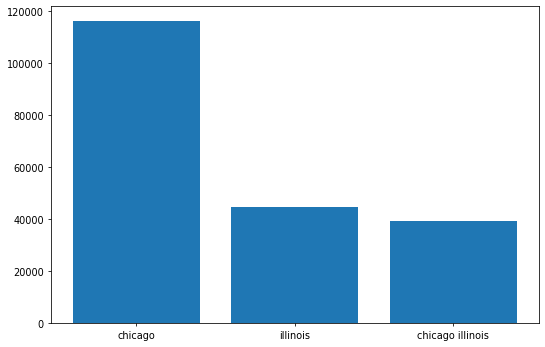

In [8]:
# Plotting the distribution of number of records by region
fig, ax = plt.subplots(figsize=(9,6), dpi=70)
ax.bar(data['region'].value_counts().index, data['region'].value_counts())

In [9]:
#creating separate datasets for chicago, illinois and chicago/illinois. Also, removing the rows which talk about shows and not actual news
data_chicago = data[(data.region == "chicago") & (data.ent != "episode")]
data_illinois = data[(data.region == "illinois") & (data.ent != "episode")]
data_chic_ill = data[(data.region == "chicago illinois") & (data.ent != "episode")]

In [10]:
data_chic_ill.head()

,date,language,title,text,title_clean,text_clean,region,ent
0,2022-01-06,english,"No deal, no school: Chicago cancels classes fo...",CHICAGO (AP) — Chicago school leaders canceled...,No deal school Chicago cancels classes 2n...,CHICAGO AP Chicago school leaders canceled ...,chicago illinois,
3,2022-01-06,english,Trump’s Solution for Chicago Public Schools? K...,Wise of Foolish?\nThe Chicago Tribune article ...,Trump Solution Chicago Public Schools King S...,Wise Foolish The Chicago Tribune article tit...,chicago illinois,
9,2022-02-10,english,Bears great Devin Hester seeks another first i...,LOS ANGELES — Exceptions should be made for ex...,Bears great Devin Hester seeks another first ...,LOS ANGELES Exceptions made exceptional ta...,chicago illinois,
10,2022-02-10,english,"With trade deadline looming, Bulls show off th...","CHARLOTTE, N.C. – The phone calls have been ma...",With trade deadline looming Bulls show team...,CHARLOTTE N C The phone calls many They ...,chicago illinois,
11,2022-02-10,english,Tough tussle: Chicago Ogden Intl steps past Ch...,Save\nChicago Ogden Intl edged Chicago Little ...,Tough tussle Chicago Ogden Intl steps past Ch...,Save Chicago Ogden Intl edged Chicago Little V...,chicago illinois,


# SENTIMENT ANALYSIS

In [ ]:
#Analysing the sentiments on the title
analyzer = SentimentIntensityAnalyzer()
data_chicago['title_sentiment'] = data_chicago['title_clean'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
data_chicago.head(2)

,date,language,title,text,title_clean,text_clean,region,ent,title_sentiment
1,2022-01-06,english,"No deal, no school: Chicago cancels classes fo...",CHICAGO (AP) — Chicago school leaders canceled...,No deal school Chicago cancels classes 2n...,CHICAGO AP Chicago school leaders canceled ...,chicago,,-0.4767
2,2022-01-06,english,Watch ‘Chicago P.D.’ Preview Wednesday,Chicago PD 9×11 “Lies” Season 9 Episode 11 Pro...,Watch Chicago P D Preview Wednesday,Chicago PD Lies Season Episode Promo V...,chicago,,0.0000


In [ ]:
%%time

analyzer = SentimentIntensityAnalyzer()

data_chicago['text_sent'] = data_chicago['text_clean'].apply(lambda x: sent_tokenize(x))

test = data_chicago[:100]

text_sentiment = []
for element in test['text_sent']:
  text_sentiment.append([analyzer.polarity_scores(sent)['compound'] for sent in element])

for i in range(len(text_sentiment)):
  if len(text_sentiment[i]) > 0:
    text_sentiment[i] = sum(text_sentiment[i])/len(text_sentiment[i])
  else:
    text_sentiment[i] = 0

# lst = []
# for i in data_chicago['text_sent'][1]:
#   lst.append(analyzer.polarity_scores(i)['compound'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


CPU times: user 9.55 s, sys: 128 ms, total: 9.68 s
Wall time: 9.65 s


In [ ]:
test['text_sentiment'] = text_sentiment

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
test[test['text_sentiment'] < 0].reset_index()['text'][7]

'Change is in the air. “Black Monday” arrived in the NFL the day after the regular season ended with a flurry of major changes beginning around the league.\nAs a new cycle of firing and hiring proceeds, we’re tracking all of the latest moves.\nTuesday\nThe Chicago Bears list of requested interviews has reached at least 5 general manager candidates and 9 coaching candidates.\nThe scoop: Recently fired Miami Dolphins coach Brian Flores was a big name to pop up in a lengthy list of candidates the Bears have contacted about interviews.\nNFL Network reported the Bears set up the interview with Flores, who went 24-25 in three seasons with the Dolphins. His last two seasons were winning ones, but the Dolphins didn’t make the playoffs.\nHere are the other coaching candidates who reportedly have been requested:\nAmong the general manager candidates are two executives from the Cleveland Browns and Indianapolis Colts:\nMonday\nThe Chicago Bears fired general manager Ryan Pace and coach Matt Nagy.

# LDA

In the following section, we run LDA on the text to identify initial topics which will be used to filter the data and then be used to identify why people / business might be leaving with respect to each of these topics

In [ ]:
%%time

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
        
        
data_list = data_chic_ill['text_clean'].tolist()        
data_tokens = list(sent_to_words(data_list))

CPU times: user 48.7 s, sys: 704 ms, total: 49.4 s
Wall time: 49.5 s


In [ ]:
#Bi-grams, tri-grams and lemmatization
bigram = gensim.models.Phrases(data_tokens, min_count=1, threshold=1)
trigram = gensim.models.Phrases(bigram[data_tokens], threshold=1)

bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)


def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:
data_words_bigrams = make_bigrams(data_tokens)
data_words_trigrams = make_trigrams(data_tokens)

# Combine tokens and n-grams
# data_tokens_cobnined = data_tokens_nostops + data_words_bigrams + data_words_trigrams
data_tokens_cobnined = data_words_trigrams

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

# Lemmatize text keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_tokens_cobnined, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

del data_tokens_cobnined, data_words_bigrams, data_words_trigrams, bigram_mod, trigram_mod

print(*data_lemmatized[:1])

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: Sele

['school_leaders_canceled_classe', 'thursday_second_consecutive_day', 'remote_learning_work', 'metrics_closing_school', 'we_choice_cancel_classe', 'martinez_said_wednesday_evening', 'news_conference_students_returne', 'winter_break_covid_infection', 'open_ramping_virus_teste', 'shifting_pandemic_white_house', 'day_earlier_said_wednesday', 'country_better_equipped_make', 'sure_schools_safely_open', 'called_closures_devastating_chicago', 'teachers_union_president_jesse', 'sharkey_said_teachers_want', 'classes_teaching_rather_school', 'conference_union_officials_teacher', 'action_approved_members_called', 'remote_instruction_cases_substantially', 'canceled_wednesday_union_voted', 'distributed_students_ahead_union', 'vote_announced_tuesday_union', 'systems_wednesday_said_locked', 'district_officials_blamed_union', 'late_cancellation_saying_despite', 'we_deeply_concerned_decision', 'leaders_said_plan_would', 'largely_low_income_black', 'latino_school_officials_labele', 'payton_said_vaccinat

/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/usr/local/lib/python3.7/dist-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use sele

In [ ]:
%%time

# Creating the term dictionary of our courpus, where every unique term is assigned an index. 
dictionary = corpora.Dictionary(data_lemmatized)

# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(doc) for doc in data_lemmatized]

CPU times: user 9.49 s, sys: 229 ms, total: 9.72 s
Wall time: 9.73 s


In [ ]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       num_topics=k,
                       random_state=100,                  
                       passes=10,
                       alpha=a,
                       eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=dictionary, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [ ]:
tuned_lda_model = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       num_topics=14,
                       random_state=100,
                       passes=10,
                       alpha='asymmetric',
                       eta='auto')

coherence_model_lda = CoherenceModel(model=tuned_lda_model, texts=data_lemmatized, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 


Coherence Score:  0.4132020041167906


In [ ]:
pprint(tuned_lda_model.print_topics())

[(0,
  '0.002*"say" + 0.002*"application" + '
  '0.002*"powered_scorestream_world_leader" + '
  '0.002*"teams_players_downloading_scorestream" + '
  '0.001*"explore_breaking_illinois_local" + 0.001*"also" + 0.001*"com" + '
  '0.001*"delta_moon_rocks_moon" + 0.001*"day" + 0.001*"time"'),
 (1,
  '0.004*"live_map_website_application" + '
  '0.003*"alerts_today_headlines_geolocated" + 0.003*"say" + '
  '0.003*"breaking_illinois_local_new" + '
  '0.002*"total_employed_individuals_living" + '
  '0.002*"poverty_line_percent_individual" + '
  '0.002*"total_individuals_years_old" + 0.002*"state" + 0.001*"also" + '
  '0.001*"function_response_return_response"'),
 (2,
  '0.028*"school" + 0.019*"student" + 0.012*"say" + 0.011*"teacher" + '
  '0.010*"district" + 0.004*"parent" + 0.004*"union" + '
  '0.004*"chicago_public_school" + 0.003*"education" + 0.003*"time"'),
 (3,
  '0.020*"say" + 0.012*"state" + 0.005*"case" + 0.005*"people" + '
  '0.004*"report" + 0.004*"also" + 0.004*"time" + 0.004*"inclu

In [ ]:
grid = {}
grid['Validation_Set'] = {}
# Topics range
min_topics = 2
max_topics = 20
step_size = 1
topics_range = range(min_topics, max_topics+1, step_size)

# Alpha parameter
# alpha = list(np.arange(0.01, 1, 0.3))
# alpha.append('symmetric')
# alpha.append('asymmetric')
alpha = ['asymmetric'] # Run for number of topics only

# Beta parameter
# beta = list(np.arange(0.01, 1, 0.3))
# beta.append('symmetric')
beta = ['auto'] # Run for number of topics only


# Validation sets
num_of_docs = len(doc_term_matrix)
corpus_sets = [# gensim.utils.ClippedCorpus(doc_term_matrix, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(doc_term_matrix, num_of_docs*0.5), 
#                gensim.utils.ClippedCorpus(doc_term_matrix, num_of_docs*0.75), 
               doc_term_matrix]
# corpus_title = ['75% Corpus', '100% Corpus']
corpus_title = ['100% Corpus']
model_results = {
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

itr = 0
itr_total = len(beta)*len(alpha)*len(topics_range)*len(corpus_title)
print(f'LDA will execute {itr_total} iterations')

    
# iterate through hyperparameters
for i in range(len(corpus_sets)):
    # iterate through number of topics
    for k in topics_range:
        # iterate through alpha values
        # tic()
        for a in alpha:
            # iterare through beta values
            for b in beta:
                # get the coherence score for the given parameters
                itr += 1
                cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=dictionary, 
                                              k=k, a=a, b=b)
                # Save the model results
                model_results['Topics'].append(k)
                model_results['Alpha'].append(a)
                model_results['Beta'].append(b)
                model_results['Coherence'].append(cv)
                pct_completed = round((itr / itr_total * 100),1)
#                 print(f'Completed Percent: {pct_completed}%, Corpus: {corpus_title[i]}, Topics: {k}, Alpha: {a}, Beta: {b}, Coherence: {cv}')
        print(f'Completed model based on {k} LDA topics. Finished {pct_completed}% of LDA runs')
        # tac()
                    
lda_tuning = pd.DataFrame(model_results)
# lda_tuning.to_csv(os.path.join(path_lda, 'lda_tuning_results.csv'), index=False)

LDA will execute 19 iterations


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 2 LDA topics. Finished 5.3% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 3 LDA topics. Finished 10.5% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 4 LDA topics. Finished 15.8% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 5 LDA topics. Finished 21.1% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 6 LDA topics. Finished 26.3% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 7 LDA topics. Finished 31.6% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 8 LDA topics. Finished 36.8% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 9 LDA topics. Finished 42.1% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 10 LDA topics. Finished 47.4% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 11 LDA topics. Finished 52.6% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 12 LDA topics. Finished 57.9% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 13 LDA topics. Finished 63.2% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  gammad, _ = self.inference([doc])
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning: 

Completed model based on 14 LDA topics. Finished 68.4% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 15 LDA topics. Finished 73.7% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 16 LDA topics. Finished 78.9% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 17 LDA topics. Finished 84.2% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 18 LDA topics. Finished 89.5% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 19 LDA topics. Finished 94.7% of LDA runs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

Completed model based on 20 LDA topics. Finished 100.0% of LDA runs


In [ ]:
lda_tuning = pd.read_csv('/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/lda_tuning.csv')

In [ ]:
lda_tuning.sort_values(by = 'Coherence', ascending = False)

,Unnamed: 0,Topics,Alpha,Beta,Coherence
16,16,18,asymmetric,auto,0.424691
12,12,14,asymmetric,auto,0.420469
8,8,10,asymmetric,auto,0.415586
10,10,12,asymmetric,auto,0.392944
13,13,15,asymmetric,auto,0.388427
7,7,9,asymmetric,auto,0.380387
15,15,17,asymmetric,auto,0.375704
9,9,11,asymmetric,auto,0.373084
14,14,16,asymmetric,auto,0.368341
17,17,19,asymmetric,auto,0.358179


# Splitting Data

## Splitting the data into different sections based on the topics derived from LDA

From the above LDA analysis, we see tat there are a few distinct topics which are being spoken about in these articles. These can be categorized as follows:

1. Sports (key words: team, player, game, season, play, point, win, lose)
2. Employment (employ*, poverty, etc)
3. Education (Student, teacher, parent, education, district)
4. Police / Crimes (shoot, police, charge, officer)
5. weather (snow?)
6. Lawyers (attorney, lawyer, bankruptcy, injury, accident)
7. Rehabs (drug(s), detox, rehab, alcohol, new beginnings)
8. Businesses (company, business)

Our next step would be to filter out the articles referring to these topics and find out exactly what is being talked about here.

In [11]:
#Classifying data into different categories:
#Sports
data['sport'] = data['text_clean'].apply(lambda x: re.findall("players?|games?|season|Chicago bears?", x))
data['sport'] = data['sport'].apply(lambda x: list(set([word.lower() for word in x])))
data['sport'] = data['sport'].apply(lambda x: ' '.join(x))

In [12]:
#Employment
data['jobs'] = data['text_clean'].apply(lambda x: re.findall("employ|poverty", x))
data['jobs'] = data['jobs'].apply(lambda x: list(set([word.lower() for word in x])))
data['jobs'] = data['jobs'].apply(lambda x: ' '.join(x))

In [13]:
#Education
data['education'] = data['text_clean'].apply(lambda x: re.findall("[Ss]tudents?|[Tt]eachers?|[Ed]ducation|[Dd]istricts?", x))
data['education'] = data['education'].apply(lambda x: list(set([word.lower() for word in x])))
data['education'] = data['education'].apply(lambda x: ' '.join(x))

In [14]:
#police
data['police'] = data['text_clean'].apply(lambda x: re.findall("[Pp]olices?|[Ss]hoot|[Cc]rime|[Cc]riminal|[Vv]iolence|[Oo]fficers?", x))
data['police'] = data['police'].apply(lambda x: list(set([word.lower() for word in x])))
data['police'] = data['police'].apply(lambda x: ' '.join(x))

In [15]:
#weather
data['weather'] = data['text_clean'].apply(lambda x: re.findall("[Ww]eather|[Ss]now|[Rr]ain|[Ss]unny", x))
data['weather'] = data['weather'].apply(lambda x: list(set([word.lower() for word in x])))
data['weather'] = data['weather'].apply(lambda x: ' '.join(x))

In [16]:
#Law
data['law'] = data['text_clean'].apply(lambda x: re.findall("[Aa]ttorney|[Ll]aw|[Bb]ankruptcy|[Ii]njury|[Aa]ccident", x))
data['law'] = data['law'].apply(lambda x: list(set([word.lower() for word in x])))
data['law'] = data['law'].apply(lambda x: ' '.join(x))

In [17]:
#Rehab
data['rehab'] = data['text_clean'].apply(lambda x: re.findall("[Dd]rugs?|[Dd]etox|[Rr]ehab|[Aa]lcohol|[Nn]ew [Bb]eginnings?", x))
data['rehab'] = data['rehab'].apply(lambda x: list(set([word.lower() for word in x])))
data['rehab'] = data['rehab'].apply(lambda x: ' '.join(x))

In [18]:
#Businesses
data['business'] = data['text_clean'].apply(lambda x: re.findall("[Cc]ompany|[Bb]usiness", x))
data['business'] = data['business'].apply(lambda x: list(set([word.lower() for word in x])))
data['business'] = data['business'].apply(lambda x: ' '.join(x))

# Sentiment on Different classes

In [ ]:
# !gsutil -m cp -n 'gs://msca-bdp-data-open/yelp/yelp_train_sentiment.json' '/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/'

Skipping existing item: file:///content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/yelp_train_sentiment.json


## Training data on Yelp Reviews and then using sentiment Analysis on it

In [19]:
yelp_path = '/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/yelp_train_sentiment.json'
yelp = pd.read_json(yelp_path, orient='records', lines=True)
yelp = yelp.sample(frac=0.10, replace=False, random_state=1).reset_index(drop=True)
X = yelp['text']
y = yelp['label']
print(X.shape)
print(y.shape)

(25572,)
(25572,)


In [20]:
# split X and y into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(19179,)
(6393,)
(19179,)
(6393,)


In [21]:
pipe_logreg = make_pipeline(
    CountVectorizer(lowercase=False, stop_words='english', ngram_range=(1,3)),
    LogisticRegression(max_iter=1000)
)

In [22]:
%time pipe_logreg.fit(X_train, y_train)

CPU times: user 45.8 s, sys: 18.3 s, total: 1min 4s
Wall time: 41.9 s


Pipeline(steps=[('countvectorizer',
                 CountVectorizer(lowercase=False, ngram_range=(1, 3),
                                 stop_words='english')),
                ('logisticregression', LogisticRegression(max_iter=1000))])

In [23]:
%time y_pred = pipe_logreg.predict(X_test)
print(f"Test Accuracy: {metrics.accuracy_score(y_test, y_pred) * 100:.1f}%")

CPU times: user 1.42 s, sys: 10.3 ms, total: 1.43 s
Wall time: 1.44 s
Test Accuracy: 95.8%


## Applying sentiment Analysis on different sections of the data

In [24]:
def filter_sentiment(filter):
  df = data[(data[filter] != '') & (data.sport == '') & (data.ent == '')]
  sentiment = pipe_logreg.predict(df['text_clean'])
  df[filter+"_sent"] = sentiment
  df = df[['date', 'language', 'title', 'text', 'title_clean', 'text_clean', filter, filter+"_sent"]]
  return df

In [25]:
#running sentiment analysis on different segments

police = filter_sentiment("police")
print("-"*10 + "police" + "-"*10)
print(police.shape)

jobs = filter_sentiment("jobs")
print("-"*10 + "jobs" + "-"*10)
print(jobs.shape)

education = filter_sentiment("education")
print("-"*10 + "education" + "-"*10)
print(education.shape)

weather = filter_sentiment("weather")
print("-"*10 + "weather" + "-"*10)
print(weather.shape)

law = filter_sentiment("law")
print("-"*10 + "law" + "-"*10)
print(law.shape)

rehab = filter_sentiment("rehab")
print("-"*10 + "rehab" + "-"*10)
print(rehab.shape)

business = filter_sentiment("business")
print("-"*10 + "business" + "-"*10)
print(business.shape)

----------police----------
(33487, 8)
----------jobs----------
(17147, 8)
----------education----------
(23963, 8)
----------weather----------
(29590, 8)
----------law----------
(36026, 8)
----------rehab----------
(8509, 8)
----------business----------
(37883, 8)


In [26]:
#Saving all datasets:
police.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/police.pkl")
jobs.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/jobs.pkl")
education.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/education.pkl")
weather.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/weather.pkl")
law.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/law.pkl")
rehab.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/rehab.pkl")
business.to_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/business.pkl")

In [27]:
def plotting_sentiment(data, column):
  df = data.groupby(by='date').agg({column: ['sum', 'count']}).reset_index()
  df.columns = [' '.join(col).strip() for col in df.columns.values]
  df = df.rename(columns = {column+ ' sum':'negative', column+' count':'total'})
  df['positive'] = df['total'] - df['negative']
  df['neg_proportion'] = df['negative']/df['total']
  df['pos_proportion'] = df['positive']/df['total']

  print("-"*15+column+"-"*15)

  fig, ax = plt.subplots(1,2,figsize=(20,9), dpi=70)

  ax[0].plot(df['date'], df['pos_proportion'], label = "Positive Sentiments", color = "green")
  ax[0].set_xticklabels(df['date'].dt.date, rotation = 45)
  ax[0].set_title('Timelines of Positive Sentiments', fontweight = 'bold');

  ax[1].plot(df['date'], df['neg_proportion'], label = "Negative Sentiments", color = "red")
  ax[1].set_xticklabels(df['date'].dt.date, rotation = 45)
  ax[1].set_title('Timelines of Negative Sentiments', fontweight = "bold");


---------------business_sent---------------


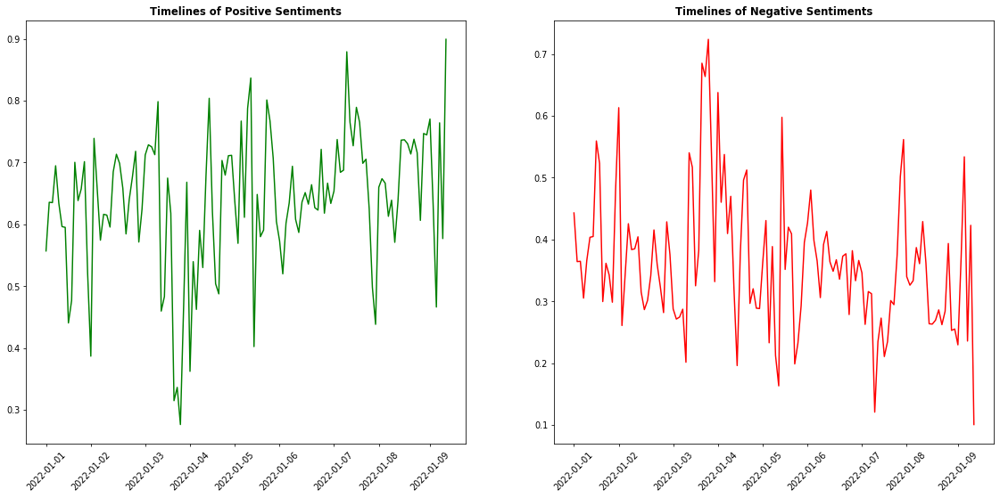

In [28]:
plotting_sentiment(business, "business_sent")

In [3]:
police = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/police.pkl")
jobs = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/jobs.pkl")
education = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/education.pkl")
weather = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/weather.pkl")
law = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/law.pkl")
rehab = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/rehab.pkl")
business = pd.read_pickle("/content/drive/MyDrive/MScA - UChicago/Assignments/Quarter 3 - Spring 2022/NLP/Final Project/Data/business.pkl")

In [9]:
def sentiment_groupby(data, column):
  df = data.groupby(by='date').agg({column: ['sum', 'count']}).reset_index()
  df.columns = [' '.join(col).strip() for col in df.columns.values]
  df = df.rename(columns = {column+ ' sum':'negative', column+' count':'total'})
  df['positive'] = df['total'] - df['negative']
  df['neg_proportion'] = df['negative']/df['total']
  df['pos_proportion'] = df['positive']/df['total']
  return df

In [12]:
police_sentiment = sentiment_groupby(police, "police_sent")
jobs_sentiment = sentiment_groupby(jobs, "jobs_sent")
education_sentiment = sentiment_groupby(education, "education_sent")
weather_sentiment = sentiment_groupby(weather, "weather_sent")
law_sentiment = sentiment_groupby(law, "law_sent")
rehab_sentiment = sentiment_groupby(rehab, "rehab_sent")
business_sentiment = sentiment_groupby(business, "business_sent")

In [60]:
def plot_sentiment(x, sentiment): 
  fig, ax = plt.subplots(figsize=(20,9), dpi=70)

  ax.plot(police_sentiment['date'][::x], police_sentiment[sentiment][::x], label = "Police", color = "#286a6c")
  ax.plot(jobs_sentiment['date'][::x], jobs_sentiment[sentiment][::x], label = "Jobs", color = "#369fc2")
  ax.plot(education_sentiment['date'][::x], education_sentiment[sentiment][::x], label = "Education", color = "#52d9de")
  ax.plot(weather_sentiment['date'][::x], weather_sentiment[sentiment][::x], label = "Weather", color = "#2c5052", linestyle = "--")
  ax.plot(law_sentiment['date'][::x], law_sentiment[sentiment][::x], label = "Law", color = "#5c8687", linestyle = "-.")
  ax.plot(rehab_sentiment['date'][::x], rehab_sentiment[sentiment][::x], label = "Rehab", color = "#00080a", linewidth = 2)
  ax.plot(business_sentiment['date'][::x], business_sentiment[sentiment][::x], label = "Business", color = "#606d6e")
  # ax.set_xticks(range(len(police_sentiment['date'][::x])))
  # ax.set_xticklabels(police_sentiment['date'][::x].dt.date, rotation = 45)
  ax.set_title('Timelines of '+ sentiment[0:3] +' Sentiments', fontweight = 'bold');

  ax.legend()

# ax[0].plot(df['date'], df['pos_proportion'], label = "Positive Sentiments", color = "green")
# ax[0].set_xticklabels(df['date'].dt.date, rotation = 45)
# ax[0].set_title('Timelines of Positive Sentiments', fontweight = 'bold');

# ax[1].plot(df['date'], df['neg_proportion'], label = "Negative Sentiments", color = "red")
# ax[1].set_xticklabels(df['date'].dt.date, rotation = 45)
# ax[1].set_title('Timelines of Negative Sentiments', fontweight = "bold");

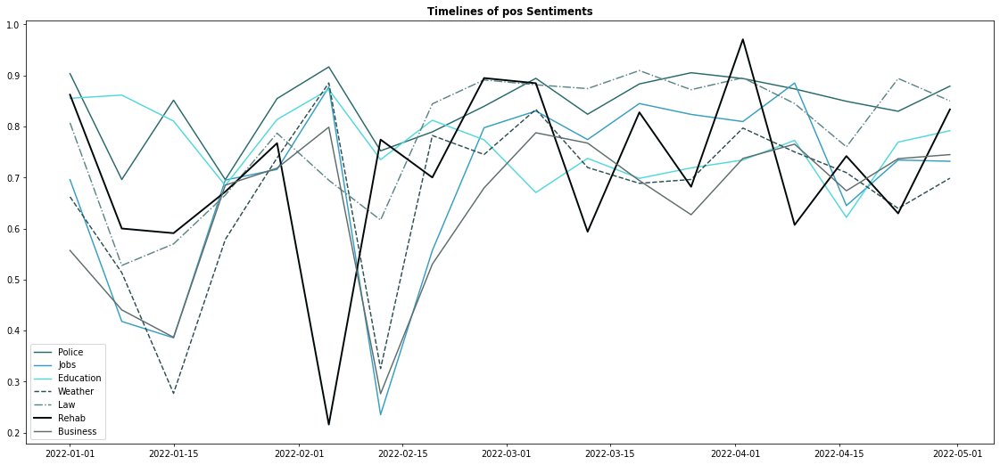

In [63]:
plot_sentiment(7, "pos_proportion")
plt.savefig("Positve.png")

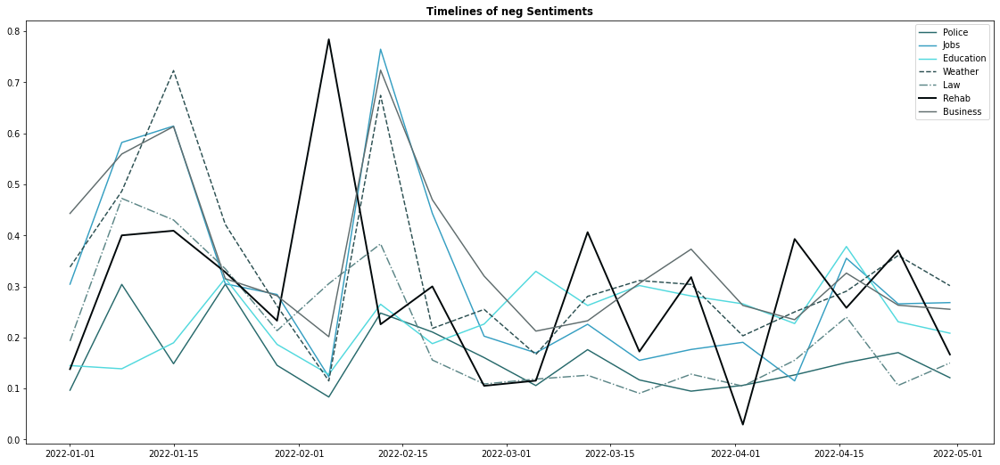

In [65]:
plot_sentiment(7, "neg_proportion")
plt.savefig('negative.png')

## Running LDA on Segmented data

In [29]:
police[police.police_sent == 0]

,date,language,title,text,title_clean,text_clean,police,police_sent
3,2022-01-06,english,Trump’s Solution for Chicago Public Schools? K...,Wise of Foolish?\nThe Chicago Tribune article ...,Trump Solution Chicago Public Schools King S...,Wise Foolish The Chicago Tribune article tit...,criminal crime violence,0
18,2022-02-10,english,The Only Guide to Chicago Divorce Lawyer,The Only Guide to Chicago Divorce Lawyer\nChic...,The Only Guide Chicago Divorce Lawyer,The Only Guide Chicago Divorce Lawyer Chicago...,criminal,0
20,2022-02-10,english,"Illinois Boy, 15, Killed in 'Targeted' Shootin...","Illinois Boy, 15, Killed in 'Targeted' Shootin...",Illinois Boy Killed Targeted Shooting W...,Illinois Boy Killed Targeted Shooting ...,criminal crime shoot violence police,0
23,2022-02-10,english,Divorce Attorney Chicago Fundamentals Explained,The 7-Second Trick For Family Lawyers Near Me\...,Divorce Attorney Chicago Fundamentals Explained,The Second Trick For Family Lawyers Near Me ...,violence,0
25,2022-02-11,english,Someone fraudulently tried to apply for Illino...,Someone fraudulently tried to apply for Illino...,Someone fraudulently tried apply Illinois un...,Someone fraudulently tried apply Illinois un...,police,0
...,...,...,...,...,...,...,...,...
200049,2022-03-30,english,Puppy goes missing after armed robbery in Wisc...,CHICAGO (CBS) – A 16-month-old puppy has gone ...,Puppy goes missing armed robbery Wisconsin D...,CHICAGO CBS A month old puppy gone missi...,criminal police crime officer,0
200063,2022-01-03,english,FDA Expands Pfizer Boosters For More Teens As ...,CHICAGO (CBS) — The U.S. is expanding COVID-19...,FDA Expands Pfizer Boosters For More Teens As ...,CHICAGO CBS The U S expanding COVID boo...,shoot police officer,0
200086,2022-03-30,english,"Man charged with shooting Chicago cop, inuring...",CHICAGO - A 28-year-old man has been charged w...,Man charged shooting Chicago cop inuring ano...,CHICAGO A year old man charged pinning ...,criminal officer officers shoot police,0
200103,2022-03-05,english,Chicago girl shot after celebrating 12th birth...,CHICAGO — A girl who was shot in the head by a...,Chicago girl shot celebrating 12th birthday p...,CHICAGO A girl shot head stray bullet ...,violence shoot police,0


In [30]:
#Defining function for Topic Modelling

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

        
def topic_modelling(data, sent_column, sentiment, num_topics):
  df = data[data[sent_column] == sentiment]
  data_list = df['text_clean'].tolist()  

  data_tokens = []

  for sentence in data_list:
    data_tokens.append(gensim.utils.simple_preprocess(str(sentence), deacc=True))

  #Bi-grams, tri-grams and lemmatization
  bigram = gensim.models.Phrases(data_tokens, min_count=1, threshold=1)
  trigram = gensim.models.Phrases(bigram[data_tokens], threshold=1)

  bigram_mod = gensim.models.phrases.Phraser(bigram)
  trigram_mod = gensim.models.phrases.Phraser(trigram)

  data_words_bigrams = [bigram_mod[doc] for doc in data_tokens]
  data_words_trigrams = [trigram_mod[bigram_mod[doc]] for doc in data_tokens]

  data_tokens_combined = data_words_trigrams

  nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

  data_lemmatized = lemmatization(data_tokens_combined, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

  del data_tokens_combined, data_words_bigrams, data_words_trigrams, bigram_mod, trigram_mod

  dictionary = corpora.Dictionary(data_lemmatized)

  doc_term_matrix = [dictionary.doc2bow(doc) for doc in data_lemmatized]

  tuned_lda_model = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       num_topics=num_topics,
                       random_state=100,
                       passes=10,
                       alpha='asymmetric',
                       eta='auto')

  coherence_model_lda = CoherenceModel(model=tuned_lda_model, texts=data_lemmatized, dictionary=dictionary, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  print('\nCoherence Score: ', coherence_lda)

  if sentiment == 1:
    print("-"*15+"Positive Topics"+"-"*15)
  else:
    print("-"*15+"Negative Topics"+"-"*15)

  pprint(tuned_lda_model.print_topics())

topic_modelling(police[0:200], "police_sent", 0, 5)


Coherence Score:  0.31748406870268414
---------------Negative Topics---------------
[(0,
  '0.007*"say" + 0.004*"school" + 0.004*"city" + 0.003*"include" + '
  '0.003*"also" + 0.003*"report" + 0.003*"may" + 0.002*"state" + '
  '0.002*"student" + 0.002*"take"'),
 (1,
  '0.006*"parent" + 0.005*"child" + 0.005*"say" + 0.004*"school" + '
  '0.004*"also" + 0.004*"may" + 0.004*"kid" + 0.003*"teacher" + '
  '0.003*"include" + 0.003*"plan"'),
 (2,
  '0.006*"say" + 0.005*"also" + 0.004*"child" + 0.004*"may" + 0.004*"police" + '
  '0.003*"get" + 0.003*"take" + 0.003*"work" + 0.003*"find" + 0.003*"lawyer"'),
 (3,
  '0.008*"say" + 0.004*"go" + 0.004*"also" + 0.003*"charge" + 0.003*"truck" + '
  '0.003*"include" + 0.003*"may" + 0.003*"vehicle" + 0.002*"find" + '
  '0.002*"need"'),
 (4,
  '0.007*"say" + 0.004*"see" + 0.004*"end" + 0.003*"people" + 0.003*"also" + '
  '0.003*"high" + 0.003*"report" + 0.003*"would" + 0.003*"take" + '
  '0.003*"rise"')]


In [135]:
%%time
topic_modelling(police, "police_sent", 0, 5)


Coherence Score:  0.47766513733970434
---------------Negative Topics---------------
[(0,
  '0.003*"certain_terms_conditions_specifie" + '
  '0.002*"violation_of_criminal_and" + 0.002*"residence_least_three_month" + '
  '0.002*"new_york_ny_this" + 0.002*"sponsor_well_released_partie" + '
  '0.002*"the_sponsor_responsible_late" + '
  '0.002*"opting_improve_chances_winning" + 0.002*"or_affect_the_safety" + '
  '0.002*"opportunities_required_enter_sweepstake" + '
  '0.002*"one_prize_within_specified"'),
 (1,
  '0.012*"say" + 0.009*"police" + 0.005*"shoot" + 0.005*"officer" + '
  '0.004*"man" + 0.003*"car" + 0.003*"report" + 0.003*"charge" + '
  '0.003*"victim" + 0.003*"vehicle"'),
 (2,
  '0.017*"say" + 0.004*"time" + 0.004*"school" + 0.003*"report" + '
  '0.003*"state" + 0.003*"year" + 0.003*"police" + 0.003*"city" + '
  '0.003*"people" + 0.003*"include"'),
 (3,
  '0.003*"say" + 0.003*"company" + 0.003*"include" + 0.003*"lawyer" + '
  '0.002*"may" + 0.002*"time" + 0.002*"state" + 0.002*"a

In [136]:
topic_modelling(rehab, "rehab_sent", 0, 7)


Coherence Score:  0.27883578896561995
---------------Negative Topics---------------
[(0,
  '0.006*"say" + 0.003*"state" + 0.003*"year" + 0.002*"include" + 0.002*"use" '
  '+ 0.002*"make" + 0.002*"also" + 0.002*"drug" + 0.002*"company" + '
  '0.002*"time"'),
 (1,
  '0.010*"say" + 0.005*"community_unit_school_district" + 0.003*"year" + '
  '0.003*"people" + 0.003*"police" + 0.003*"time" + 0.003*"report" + '
  '0.003*"also" + 0.002*"use" + 0.002*"call"'),
 (2,
  '0.009*"say" + 0.004*"state" + 0.003*"also" + 0.003*"get" + 0.003*"use" + '
  '0.003*"make" + 0.003*"work" + 0.003*"time" + 0.002*"report" + 0.002*"go"'),
 (3,
  '0.010*"say" + 0.004*"time" + 0.004*"people" + 0.003*"year" + 0.003*"get" + '
  '0.003*"also" + 0.003*"case" + 0.003*"state" + 0.003*"work" + 0.002*"go"'),
 (4,
  '0.008*"say" + 0.003*"people" + 0.003*"state" + 0.003*"also" + 0.003*"year" '
  '+ 0.003*"use" + 0.003*"get" + 0.003*"time" + 0.003*"go" + 0.002*"include"'),
 (5,
  '0.008*"say" + 0.004*"state" + 0.003*"use" + 

In [139]:
topic_modelling(jobs, "jobs_sent", 0, 7)


Coherence Score:  0.44782836720481606
---------------Negative Topics---------------
[(0,
  '0.006*"employee" + 0.004*"state" + 0.004*"say" + 0.003*"provide" + '
  '0.003*"employer" + 0.003*"include" + 0.002*"also" + 0.002*"time" + '
  '0.002*"require" + 0.002*"business"'),
 (1,
  '0.004*"say" + 0.003*"body" + 0.003*"company" + 0.003*"include" + '
  '0.003*"mdjobsite_com_hire_physician" + 0.003*"top_hiring_employers_use" + '
  '0.003*"online_simply_fill_short" + 0.002*"employee" + 0.002*"state" + '
  '0.002*"require"'),
 (2,
  '0.004*"his_her_state_of" + 0.004*"the_sponsor_reserves_right" + '
  '0.004*"tickets_subject_certain_term" + '
  '0.002*"construction_validity_interpretation_enforceability" + '
  '0.002*"who_may_be_similarly" + 0.002*"the_entrants_individual_capacity" + '
  '0.002*"and_not_as_plaintiff" + 0.002*"residence_least_three_month" + '
  '0.002*"manner_including_following_private" + '
  '0.002*"distancing_mask_wearing_teste"'),
 (3,
  '0.006*"say" + 0.003*"may" + 0.003*

In [140]:
topic_modelling(education, "education_sent", 0, 7)


Coherence Score:  0.4464888500582215
---------------Negative Topics---------------
[(0,
  '0.021*"school" + 0.017*"say" + 0.013*"student" + 0.008*"teacher" + '
  '0.008*"district" + 0.005*"parent" + 0.005*"union" + 0.004*"state" + '
  '0.004*"city" + 0.003*"child"'),
 (1,
  '0.010*"say" + 0.003*"case" + 0.003*"state" + 0.003*"time" + 0.003*"city" + '
  '0.002*"year" + 0.002*"school" + 0.002*"student" + 0.002*"include" + '
  '0.002*"district"'),
 (2,
  '0.005*"say" + 0.003*"school" + 0.003*"student" + 0.002*"district" + '
  '0.002*"chicago_public_school" + 0.002*"state" + 0.002*"college" + '
  '0.002*"time" + 0.002*"union_president_jesse_sharkey" + 0.001*"include"'),
 (3,
  '0.004*"tickets_subject_certain_term" + '
  '0.002*"class_or_representative_proceeding" + '
  '0.002*"arbitration_of_disputes_pursuant" + '
  '0.002*"claim_or_controversy_arbitrate" + 0.002*"to_this_paragraph_shall" + '
  '0.002*"the_arbitrator_may_not" + 0.002*"violation_of_criminal_and" + '
  '0.002*"claims_of_oth

In [141]:
topic_modelling(weather, "weather_sent", 0, 7)


Coherence Score:  0.4825995672517312
---------------Negative Topics---------------
[(0,
  '0.013*"say" + 0.009*"school" + 0.007*"state" + 0.005*"mask" + '
  '0.005*"student" + 0.004*"district" + 0.004*"per_past_week_new" + '
  '0.003*"teacher" + 0.003*"day" + 0.003*"include"'),
 (1,
  '0.007*"say" + 0.003*"include" + 0.003*"use" + 0.003*"may" + 0.003*"time" + '
  '0.003*"work" + 0.003*"make" + 0.003*"get" + 0.003*"go" + 0.003*"also"'),
 (2,
  '0.008*"say" + 0.003*"state" + 0.003*"time" + 0.003*"include" + '
  '0.003*"people" + 0.003*"day" + 0.002*"snow" + 0.002*"year" + 0.002*"also" + '
  '0.002*"report"'),
 (3,
  '0.005*"say" + 0.003*"also" + 0.003*"well" + 0.003*"time" + 0.002*"work" + '
  '0.002*"use" + 0.002*"area" + 0.002*"state" + 0.002*"may" + 0.002*"year"'),
 (4,
  '0.024*"say" + 0.005*"police" + 0.005*"city" + 0.004*"people" + '
  '0.004*"officer" + 0.004*"time" + 0.003*"call" + 0.003*"state" + '
  '0.003*"report" + 0.003*"also"'),
 (5,
  '0.010*"say" + 0.007*"state" + 0.004*

In [142]:
topic_modelling(law, "law_sent", 0, 7)


Coherence Score:  0.4410757435437821
---------------Negative Topics---------------
[(0,
  '0.012*"say" + 0.009*"school" + 0.007*"state" + 0.005*"district" + '
  '0.004*"student" + 0.004*"mask" + 0.003*"child" + 0.003*"teacher" + '
  '0.003*"parent" + 0.003*"community_unit_school_district"'),
 (1,
  '0.003*"the_sponsor_reserves_right" + '
  '0.003*"certain_terms_conditions_specifie" + 0.002*"also" + '
  '0.001*"attorneys_fees_court_cost" + '
  '0.001*"construction_validity_interpretation_enforceability" + '
  '0.001*"fluctuations_any_difference_state" + '
  '0.001*"the_sponsor_responsible_late" + 0.001*"lost_damaged_stolen_luggage" '
  '+ 0.001*"sponsor_well_released_partie" + 0.001*"new_york_ny_this"'),
 (2,
  '0.006*"say" + 0.006*"state" + 0.006*"also" + 0.003*"attorney" + '
  '0.003*"well" + 0.003*"lawyer" + 0.002*"court" + 0.002*"law" + 0.002*"case" '
  '+ 0.002*"year"'),
 (3,
  '0.007*"say" + 0.003*"state" + 0.002*"also" + 0.001*"year" + 0.001*"time" + '
  '0.001*"work" + 0.001*"r

In [143]:
topic_modelling(business, "business_sent", 0, 7)


Coherence Score:  0.4234291440472508
---------------Negative Topics---------------
[(0,
  '0.009*"shares_industrial_products_company" + '
  '0.007*"industrial_products_company_stock" + '
  '0.006*"shares_illinois_tool_work" + 0.006*"illinois_tool_work" + '
  '0.004*"works_inc_nyse_itw" + 0.003*"owns_shares_industrial_product" + '
  '0.003*"products_company_stock_worth" + 0.003*"insider_trades_illinois_tool" '
  '+ 0.003*"tool_works_third_quarter" + 0.003*"products_company_stock_value"'),
 (1,
  '0.008*"say" + 0.007*"company" + 0.006*"business" + 0.003*"state" + '
  '0.003*"also" + 0.003*"year" + 0.003*"work" + 0.003*"report" + 0.003*"city" '
  '+ 0.002*"service"'),
 (2,
  '0.007*"company" + 0.005*"business" + 0.004*"include" + 0.004*"say" + '
  '0.004*"use" + 0.003*"work" + 0.003*"new" + 0.003*"loan" + 0.003*"may" + '
  '0.003*"year"'),
 (3,
  '0.005*"business" + 0.005*"company" + 0.005*"also" + 0.004*"may" + '
  '0.004*"lawyer" + 0.004*"get" + 0.004*"use" + 0.003*"state" + 0.003*"tim

In [82]:
weather[weather.weather_sent == 0].reset_index()

,index,date,language,title,text,title_clean,text_clean,weather,weather_sent
0,1,2022-01-06,english,"No deal, no school: Chicago cancels classes fo...",CHICAGO (AP) — Chicago school leaders canceled...,No deal school Chicago cancels classes 2n...,CHICAGO AP Chicago school leaders canceled ...,rain,0
1,49,2022-05-03,english,"Expect more rainy, gloomy weather in Chicago t...",CHICAGO - May is picking up pretty much where ...,Expect rainy gloomy weather Chicago today ...,CHICAGO May picking pretty much gloomy A...,rain,0
2,71,2022-01-12,english,‘I have to accept we lost’: Some Chicago teach...,With mixed feelings and frustration with their...,I accept lost Some Chicago teachers still ...,With mixed feelings frustration bosses Chi...,rain,0
3,77,2022-04-07,english,Amtrak 351 arrived in to Chicago 13 minutes early,Despite traversing the NS's over capacity Chic...,Amtrak arrived Chicago minutes early,Despite traversing NS capacity Chicago line...,rain,0
4,85,2022-01-07,english,Virus Outbreak Chicago Schools,AP Virus Outbreak Chicago Schools Charles Rex ...,Virus Outbreak Chicago Schools,AP Virus Outbreak Chicago Schools Charles Rex ...,rain weather snow,0
...,...,...,...,...,...,...,...,...,...
18729,200043,2022-04-19,english,Champaign County nonprofits train indigenous i...,CHAMPAIGN — Champaign-Urbana nonprofits are us...,Champaign County nonprofits train indigenous i...,CHAMPAIGN Champaign Urbana nonprofits using ...,rain,0
18730,200067,2022-03-05,english,Illinois schools temporarily blocked from enfo...,Illinois schools temporarily blocked from enfo...,Illinois schools temporarily blocked enforcin...,Illinois schools temporarily blocked enforcin...,rain,0
18731,200097,2022-04-01,english,Tornado causes minor damage in southeastern Il...,"CARMI, Ill. (AP) — The National Weather Servic...",Tornado causes minor damage southeastern Illi...,CARMI Ill AP The National Weather Service...,weather,0
18732,200103,2022-03-05,english,Chicago girl shot after celebrating 12th birth...,CHICAGO — A girl who was shot in the head by a...,Chicago girl shot celebrating 12th birthday p...,CHICAGO A girl shot head stray bullet ...,rain,0
